## Import
>Importo le immagini dei volti del Dataset AT\&T Facedatabase e creo la matrice delle componenti

In [1]:
import sys, os
import numpy as np
from PIL import Image
from matplotlib import cm
#Read images from folders
#X images and y labels 
X,y =[],[] 
path = os.walk('/Users/marco/Desktop/MASL/Datasets/att-database-of-faces')
for (root, dirs, file) in path:
    for(subdirs) in dirs:
        person_path = os.path.join(root, subdirs)
        id_person = int(subdirs[1:])
        for filename in os.listdir(person_path):
            img = Image.open(os.path.join(person_path, filename))  
            img = img.convert("L")
            X.append(np.asarray(img,dtype=np.uint8))
            #display(Image.fromarray(X[0]))  
            y.append(id_person)
            #display(img)
    break  
#shape of each images
shape_att = X[0].shape



>Definiamo una funzione che dato in input il vettore delle immagini, ovvero il vettore che ha in ogni posizione una matrice di pixel che rappresenta un'immagine; restituisca una matrice dove in ogni colonna c'è un'immagine, rappresentata come la matrice di pixel 'appiattita' come vettore colonna. 
### Function: imgToComponent

In [2]:
def imgToComponent(X):
    total = 1
    for i in range (0, np.ndim(X[0])):
        total = total * X[0].shape[i]
    Xcomp = np.empty([total, 0], dtype = X[0].dtype)

    for elem in X:
        Xcomp = np.append(Xcomp, elem.reshape(-1,1), axis=1)
    Xcomp = np.asmatrix(Xcomp)
    #Xcomp_mean = Xcomp.mean(axis = 1).reshape(-1,1)
    #Xcomp = Xcomp - Xcomp_mean
    #return(Xcomp, Xcomp_mean)
    return(Xcomp)

    

>Usiamo quindi la funzione definita sopra per generare la matrice delle componenti dove in ogni colonna sarà presente un volto di ogni campione e su ogni riga ci sarà una feature

In [3]:
y_att = np.asarray(y)
X_att = imgToComponent(X)

>Definisco la funzione PCA per il calcolo delle componenti principali e la sua alternativa SVD che rappresenta un'ottima variante in termini di costo computazionale soprattutto in caso di alta dimensionalità 

### Function: PCA

In [44]:
def pca(X):   
    #The original matrix must have samples on coloumn and features on row      
    d, n = X.shape
    X_mean = X.mean(axis = 1).reshape(-1,1)
    X = X - X_mean
    if d < n:
        Cov = np.dot(X, X.T)
        eigenvalues, eigenvectors = np.linalg.eig(Cov)
    else:
        Cov = np.dot(X.T, X)
        eigenvalues, eigenvectors = np.linalg.eig(Cov)
        eigenvectors =np.dot(X,eigenvectors)
        for i in range(n):
            eigenvectors[:,i] = eigenvectors[:,i]/np.linalg.norm(eigenvectors[:,i])
    #eigenvectors sorting based on biggest eigenvalues
    index_sort = np.argsort(-eigenvalues.real) 
    eigenvalues = eigenvalues[index_sort]
    eigenvectors = np.array(eigenvectors)[:,index_sort]
    return(eigenvalues, eigenvectors, X_mean)

#Return the numer of components that we need 
def selectPcaComponents(X, eigenvectors, num_components = 0):
    d,n = X.shape
    #Number of PCs must be in the range 1 and features number
    if (num_components > d or num_components < 1):
        num_components = d
    if (n < num_components):
        num_components = n 
    #We are interested only firtst num_componets components
    eigenvectors = eigenvectors[0:,0:num_components]
    return eigenvectors

#Function that project samples in X  to pca space
def pcaProject (X,eigenvectors, X_mean):
    return np.dot(eigenvectors.T, (X-X_mean))
    

### Function: SVD

In [45]:
def svd(X):
    #The original matrib must have samples on coloumn and features on row      
    #Compute X transposed because SVD work with matrix with features on coloumn and samples on row
    X_mean = X.mean(axis = 1).reshape(-1,1)
    X = X - X_mean
    X = X.T
    #Compute thin SVD instead of full SVD
    U, Sigma, Vh = np.linalg.svd(X, full_matrices=False) 
    #np.square((Sigma) / (m - 1))
    return(U, Sigma, Vh, X_mean)

def selectSvdComponents(X, U, Sigma, Vh, num_components = 0):
    d,n = X.shape
    #Number of PCs must be in the range 1 and features number
    if (num_components > d or num_components < 1):
        num_components = d
    if (n < num_components):
        num_components = n 
    #We are interested only firtst num_componets components
    Vh = Vh.T[0:,0:num_components]
    U = U[0:,0:num_components]
    Sigma = Sigma[0:num_components] 
    return (U, Sigma, Vh)
    
def svdCompute(X, U, Sigma, Vh):    
    #Compute points on new subspace
    X_svd = np.dot(U, np.diag(Sigma))
    #Return components by coloumn (to be PCA coherent) and PCs
    return (X_svd.T, Vh)

>Adesso, possiamo calcolare le componenti principali mediante uno dei due algoritmi 

In [46]:
#Compute PCs through PCA
eigenval_att, eigenvectors_att, X_mean_att = pca(X_att)
eigenvectors_att = selectPcaComponents(X_att, eigenvectors_att, num_components = 20)
X_pca_att = pcaProject(X_att,eigenvectors_att, X_mean_att)

>Chiaramente possiamo arrivare allo stesso risultato con SVD e controllare che il risultato due algoritmi sia effettivamente lo stesso 

In [47]:
#Alternatively, we can compute PCs through SVD decomposition
U, Sigma, Vh, X_mean_att = svd(X_att)
U, Sigma, Vh = selectSvdComponents(X_att, U, Sigma, Vh, num_components = 20)
X_pca_att2, eigenvectors_att2 = svdCompute(X_att, U, Sigma, Vh)

#And we can see that the result is the same 
X_pca_att1 = (np.absolute(X_pca_att))
X_pca_att1 = X_pca_att1.round(decimals=3)
X_pca_att2 = (np.absolute(X_pca_att2))
X_pca_att2 = X_pca_att2.round(decimals=3)
eigenvectors_att1 = (np.absolute(eigenvectors_att))
eigenvectors_att1 = eigenvectors_att1.round(decimals=3)
eigenvectors_att2 = (np.absolute(eigenvectors_att2))
eigenvectors_att2 = eigenvectors_att2.round(decimals=3)
print(np.array_equal(X_pca_att1,X_pca_att2))
print(np.array_equal(eigenvectors_att1,eigenvectors_att2))

True
True


>Possiamo far vedere, anche con un semplice esempio che il risultato dei due algoritmi (PCA e SVD) è lo stesso

In [48]:
m = np.asmatrix([[-0.8,-1.8,0.2,2.2,0.2],[0,0,1,-1,0],[1.6,-0.4,-0.4,-1.4,0.6]])
#m = m - m.mean(axis = 1)
eigval, eigvec, X_mu = pca(m)
e = selectPcaComponents(m, eigvec, num_components = 2)
a = pcaProject (m, e, X_mu)

U, Sigma, Vh, X_mu = svd(m)
U, Sigma, Vh = selectSvdComponents(m, U, Sigma, Vh, num_components = 2)
b, e1 = svdCompute(m, U, Sigma, Vh)
#print('----- eigenvalues -------')
a = (np.absolute(a))
a = a.round(decimals=3)
b = (np.absolute(b))
b = b.round(decimals=3)
#print(a)
#print('-----')
#print(b)
#print('----- eigenvectors -------')
e = (np.absolute(e))
e = e.round(decimals=3)
#print(e)
#print('-----')
e1 = np.absolute(e1)
e1 = e1.round(decimals=3)
#print(e1)
print(np.array_equal(e,e1))
print(np.array_equal(a,b))

True
True


>Vediamo adesso come sia possibile stampare gli Eigenfaces (PCs) come fossero immagini, in quanto mantengono la dimensionalità delle immagini originarie.<br>
Per fare ciò, definiamo prima di tutto una funzione che ci aiuti a costruire il plot e quindi affiancare le immagini nella visualizzazione degli Eigenfaces.


### Function: Subplot

In [49]:
import matplotlib.pyplot as plt
def create_font(fontname='Tahoma', fontsize=10):
    return { 'fontname': fontname, 'fontsize':fontsize }

def subplot(title, images, rows, cols, sptitle="subplot", sptitles=[], colormap=cm.gray, ticks_visible=True, filename=None):
    fig = plt.figure(figsize=[14,10], dpi=400)
    # main title
    fig.text(.5, .95, title, create_font('Tahoma',20), horizontalalignment='center') 
    for i in range(len(images)):
        ax0 = fig.add_subplot(rows,cols,(i+1))
        plt.setp(ax0.get_xticklabels(), visible=False)
        plt.setp(ax0.get_yticklabels(), visible=False)
        if len(sptitles) == len(images):
            plt.title("%s #%s" % (sptitle, str(sptitles[i])), create_font('Tahoma',10))
        else:
            plt.title("%s #%d" % (sptitle, (i+1)), create_font('Tahoma',10))
        plt.imshow(np.asarray(images[i]), cmap=colormap)
    if filename is None:
        plt.show()
    else:
        fig.savefig(filename)

>Inoltre usiamo una funzione di normalizzazione del tipo Min-Max per normalizzare nell'intervallo tra 0 e 255 i valori della matrice delle immagini degli Eigenfaces secondo la codifica uint8 ad 8 bit, in quanto alcuni valori potrebbero eccedere il valore 255 oppure essere negativi

### Function: minmax_normalize

In [50]:
def minmax_normalize(X, low, high, minX=None, maxX=None, dtype=np.float):
    """ min-max normalize a given matrix to given range [low,high].
    
    The eigenvectors can contain negative values but images data is excepted as unsigned integer values
    in the range of 0 to 255 
    
    Args:
        X [rows x columns] input data
        low [numeric] lower bound
        high [numeric] upper bound
    """
    if minX is None:
        minX = np.min(X)
    if maxX is None:
        maxX = np.max(X)
    minX = float(minX)
    maxX = float(maxX)
    # Normalize to [0...1].    
    X = X - minX
    X = X / (maxX - minX)
    # Scale to [low...high].
    X = X * (high-low)
    X = X + low
    return np.asarray(X, dtype=dtype)

# Show Eigenfaces 
>In questo caso, stampiamo i primi 20 Eigenfaces ottenuti (anche nel caso ne avessimo considerati di più)

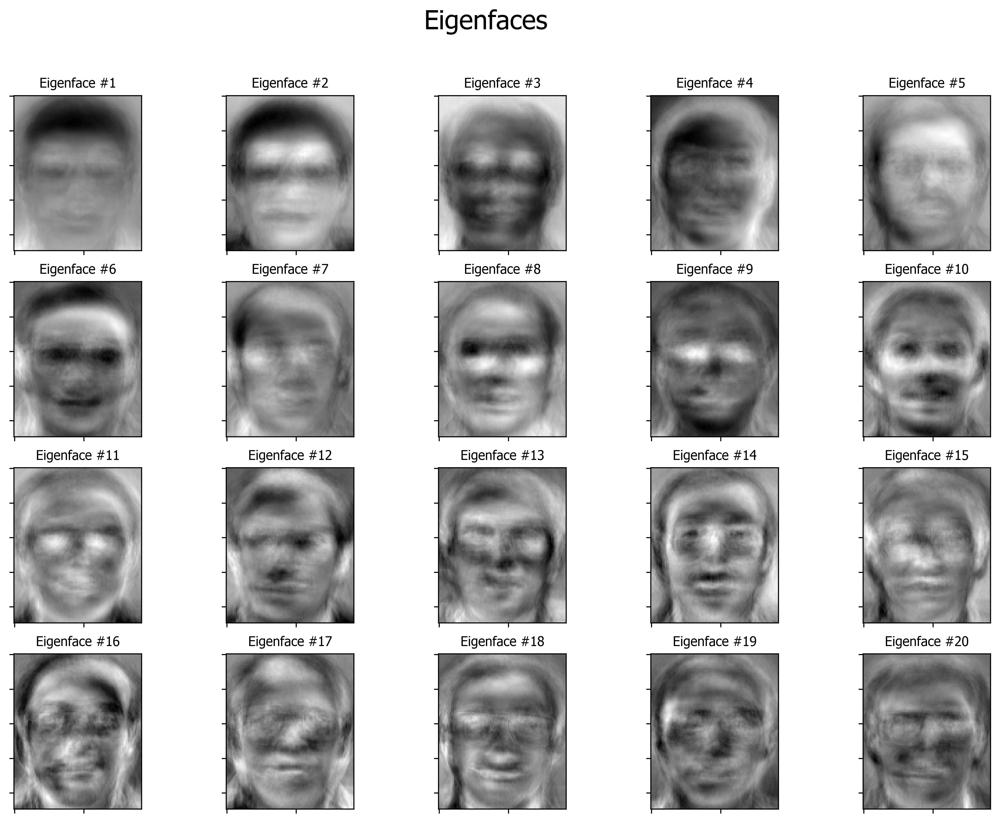

In [51]:
#EIGENFACES PLOT
#Faccio il plot delle componenti principali, nel caso fossero più di 20 stampo solo le prime 20
E = []
for i in range(min(eigenvectors_att.shape[1], 20)):
    #Rearrange each PCs as original matrix 112*92
    e = eigenvectors_att[:,i].reshape(shape_att)
    E.append(minmax_normalize(e,0,255, dtype=np.uint8))
    
subplot(title="Eigenfaces", images=E, rows=4, cols=5, sptitle="Eigenface", colormap=cm.gray, filename="Eigenfaces.png")

# Reconstruction
>Vediamo adesso un esempio di ricostruzione delle immagini dal sottospazio a bassa dimensionalità di PCA, per fare ciò, definiamo due funzioni che ci aiuteranno nel processo di ricostruzione

### Function: reconstruction

In [11]:
def reconstruction(PC, X_pca_comp, X_comp_mean, img_shape):
    """ Reconstruct the original image given:
    Principal components (eigenvectors)
    Matrix given by PCA function,
    Mean for each components (used for center the matrix), 
    
    Args:
        PC  [row x columns] principal components (eigenvectors)
        X_pca_comp [row x columns] matrix returned from PCA function
        X_comp_mean [vector column] mean for each components
        
    The trick for reconstruct the components is the follow:
    given Y = PC.T(X_comp - X_comp_mean ) we can find X_comp simply by:
    X_comp = PC*Y+X_comp_mean
    
    More components are returned form PCA alghoritm more accurate will be the reconstruction 
    (if all components are returned, reconstruction will return the original images)
    """
    #Return a list where  each i-th element represents the reconstructed image of the i-th face
    #if X_comp_mean != 0:
    reconstr = np.dot(PC,X_pca_comp) + X_comp_mean
    #else:
        #reconstr = np.dot(PC,X_pca_comp)
    re = []
    for i in range(reconstr.shape[1]):
        temp = reconstr[:,i].reshape(img_shape) #.astype('uint8')
        temp = Image.fromarray(np.asarray(minmax_normalize(temp,0,255, dtype=np.uint8), dtype="uint8"), "L" )
        #temp = Image.fromarray( np.asarray(temp, dtype="uint8"), "L" )
        re.append(temp)
    
    """
    To print an image use function display() as: display(re[i]) for show i-th image
    """
    return(re)

>E una funzione che, calcoli prima la rappresentazione con il massimo numero di componenti principali e successivamente ricostruisca l'immagine all'aumentare del numero di componenti, utilizzando quindi un numero di componenti sempre maggiore

### Function: IterativeReconstruction

In [12]:
def IterativeReconstruction(X_comp, min_num_components, max_num_components, step, face_id, img_shape):
    """ Reconstruct the original image many times with an incremental numbers of PC
    Args:
        X_comp  [row x columns] original matrix
        max_num_components [row x columns] max number of component that will be used
        min_num_components [vector column] min number of component that will be used
        step [integer] step between number of components to use
        face_id [integer] id of face to reconstruct       
    """
    eigenval, eigenvectors, X_comp_mean = pca(X_comp)
    
    steps = np.arange(min_num_components,min(eigenvectors.shape[1],max_num_components),step)
    #Face_reconstr is the container of 'face_id-th' reconstructed face as the components increase
    Face_reconstr = []
    for i in steps:
        #Rotate original components
        PC = selectPcaComponents(X_comp, eigenvectors, num_components = i)
        New_c = pcaProject(X_comp, PC, X_comp_mean)        
        #Reconstruct all original components using 'i' principal components
        Origin_c = reconstruction(PC, New_c, X_comp_mean, img_shape)
        #Save j-th images reconstructed in Face_reconstr
        Face_reconstr.append(Origin_c[face_id])
    return(Face_reconstr, steps)

>Adesso siamo quindi pronti a vedere una ricostruzione dell'immagine originale, all'aumentare del numero di Eigenfaces utilizzati<br>
Vediamo prima di tutto l'immagine originale che vogliamo ricostruire

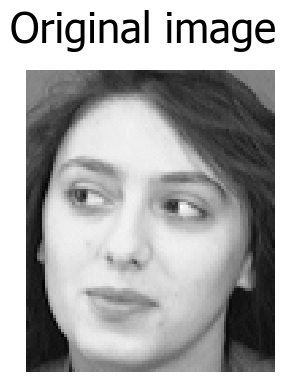

In [13]:
#Before, Let's see the original image to reconstruct
fig = plt.figure(dpi=100)
fig.text(.5, .95, 'Original image', create_font('Tahoma',30), horizontalalignment='center')
plt.imshow(np.asarray(X[208]),cmap = cm.gray)
plt.axis('off')
plt.show()
fig.savefig('ImageToReconstruct')

>Proviamo quindi a ricostruire iterativamente l'immagine all'aumentare degli Eigenfaces mediante le funzioni di ricostruzione definite in precedenza.<br>
In particolare proviamo 20 ricostruzioni con un numero di Eigenvectors che va da 10 a 400 con step di 20

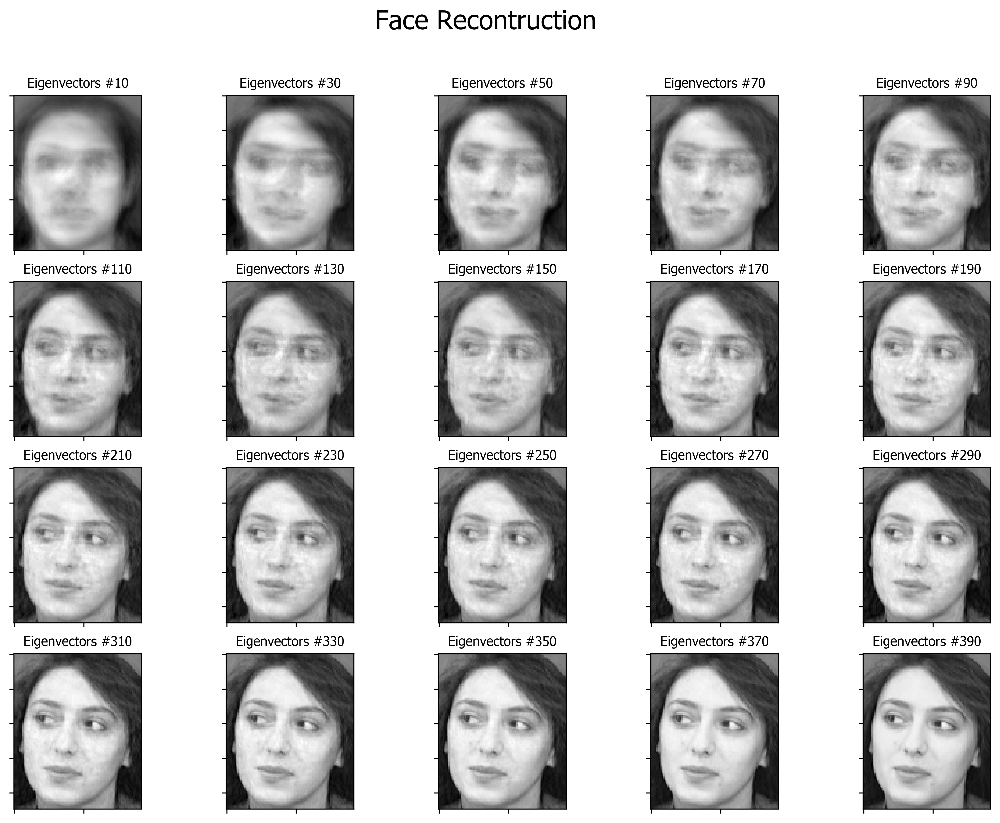

In [22]:
#FACE RECONTRUCTION : LET'S SEE FACE RECONSTRUCTION AS THE EIGENFACES INCREASE
#Now, let`s do the recontruction
rec, steps = IterativeReconstruction(X_att, 10, 400, 20, 208, shape_att)
subplot(title="Face Recontruction", images=rec, rows=4, cols=5, sptitle="Eigenvectors",sptitles =steps, filename="FaceRecontruction.png")



>Calcoliamo adesso i Fisherfaces del Dataset, utilizzando le funzioni seguenti

### Function: LDA

In [14]:
def lda(X, y): 
    y = np.asarray(y)
    d,n = X.shape
    #classes
    c, Ni = np.unique(y, return_counts=True)
    meanTotal = X.mean(axis=1).reshape(-1,1)
    #Def scatter matrix Sw and Sb
    Sw = np.zeros((d, d), dtype=np.float32) 
    Sb = np.zeros((d, d), dtype=np.float32)   
    #elem = 0
    for i in c:      
        Xi = X[:,np.where(y==i)[0]]
        #Mean of i-th class
        meanClass = Xi.mean(axis=1).reshape(-1,1)
        Sw = Sw + np.dot((Xi-meanClass), (Xi-meanClass).T)       
        #Sb = Sb + m * np.dot((meanClass - meanTotal), (meanClass - meanTotal).T)
        Sb = Sb + np.size(Xi,1) * np.dot((meanClass - meanTotal), (meanClass - meanTotal).T)
        #Sb = Sb + Ni[elem] * np.dot((meanClass - meanTotal), (meanClass - meanTotal).T)
        #elem +=1     
    eigenvalues , eigenvectors = np.linalg.eig(np.linalg.inv(Sw)*Sb)
    #Nonostante il numero massimo di autovalori diversi da zero sia n-c, c'è la possibilità
    #che ne restituisca di più. Questo è dovuto probabilmente ad errori di precisione. 
    #quindi quelli che viene fatto è limitare forzatamente in numero di autovalori ed atuovettori a c-1
    idx = np.argsort(-eigenvalues.real)
    eigenvalues , eigenvectors = eigenvalues[idx], eigenvectors[:,idx]
    #Return all eigenvalues and all eigenvectors
    eigenvalues = np.array(eigenvalues[0:len(c)-1].real, dtype=np.float32)
    eigenvectors = np.array(eigenvectors[0:,0:len(c)-1].real, dtype=np.float32)
    return [eigenvalues , eigenvectors]

### Function: Fisherfaces

In [15]:
def fisherfaces(X, y): 
    #The original matrix must have samples on coloumn and features on row  
    y = np.asarray(y)
    #n,m = X.shape
    d,n = X.shape
    c = len(np.unique(y))
    #Compute PCA
    eigenval, eigenvec, X_mean = pca(X)
    eigenvectors_pca = selectPcaComponents(X, eigenvec, num_components = (n-c))
    X_pca_comp = pcaProject(X,eigenvectors_pca, X_mean)
    
    
    eigenvalues_lda , eigenvectors_lda = lda(X_pca_comp, y)
    #print('Dimensione autovalori pca:', eigenvectors_pca.shape)
    #print('Dimensione autovalori lda:', eigenvectors_lda.shape)
    eigenvectors = np.dot(eigenvectors_pca ,eigenvectors_lda) 
    
    #Eigenvalues and Eigenvector sorting
    #idx = np.argsort(-eigenvalues_lda.real)
    #eigenvalues_lda , eigenvectors = eigenvalues_lda[idx], eigenvectors[:,idx]
    return [eigenvalues_lda , eigenvectors]

def SelectLdaComponents(X, eigenvectors_lda, num_components=0): 
    c, Ni = np.unique(y, return_counts=True)
    if (num_components < 1) or (num_components > eigenvectors_lda.shape[1]): 
        num_components = eigenvectors_lda.shape[1]   
    #Select first num_componets components
    eigenvectors_lda = np.array(eigenvectors_lda[0:,0:num_components].real, dtype=np.float32)
    return (eigenvectors_lda)

def ldaProject (X, eigenvectors_lda):
    #Compute points on the new subspace 
    return np.dot(eigenvectors_lda.T, X)

>Adesso, possiamo calcolare le componenti principali ottenute da LDA mediante il metodo Fisherfaces e quindi gli algoritmi definiti nelle funzioni sopra

In [16]:
eigenvalues_lda_att, eigenvectors_lda_att = fisherfaces(X_att, y_att)
eigenvectors_lda_att = SelectLdaComponents(X_att, eigenvectors_lda_att, num_components= 20)
X_lda_att = ldaProject(X_att, eigenvectors_lda_att)
#print(X_lda_att.shape)

# Show Fisherfaces
>Adesso possiamo provare a stampare i Fisherfaces come fatto prima per gli Eigenfaces, questa volta però utilizzando una jet color map per avere una migliore visualizzazione delle componenti

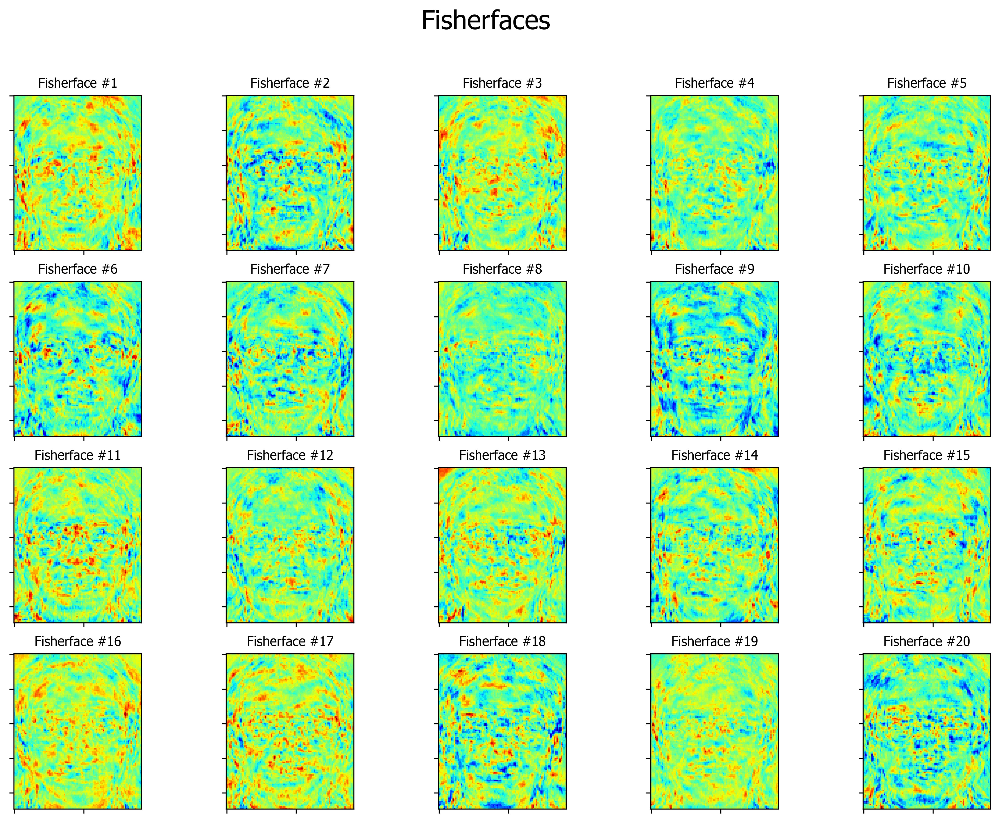

In [26]:
#FISCHERFACES PLOT
#Faccio il plot delle componenti principali, nel caso fossero più di 20 stampo solo le prime 20
E = []
for i in range(min(eigenvectors_lda_att.shape[1], 20)):
    #Riorganizzo ogni componente principale come matrice 112*92 originale
    e = eigenvectors_lda_att[:,i].reshape(shape_att)
    E.append(minmax_normalize(e,0,255, dtype=np.uint8))
    
subplot(title="Fisherfaces", images=E, rows=4, cols=5, sptitle="Fisherface", colormap=cm.jet, filename="Fisherfaces.png")



# Reconstruction LDA
>Purtroppo con LDA non si hanno le ottime capacità di ricostruzione dell'immagine viste con PCA.<br>
Facciamo vedere che a differenza di PCA, con LDA e i Fisherfaces non è possibile ricostruire in modo accurato le immegini di partenza. La seguente è una ricostruzione della prima immagine usando il massimo numero di fisherfaces generati dall'algoritmo

Immagine di partenza


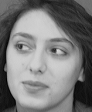

Immagine ricostruita con LDA


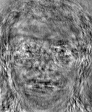

In [17]:
eigenvalues_lda_att, eigenvectors_lda_att = fisherfaces(X_att, y_att)
eigenvectors_lda_att = SelectLdaComponents(X_att, eigenvectors_lda_att, num_components= 0)
X_lda_att = ldaProject(X_att, eigenvectors_lda_att)

#eigenvalues_lda_att, eigenvectors_lda_att = fisherfaces(X_att, y_att)
#X_lda_att, eigenvectors_lda_att  = LDACompute(X_att, y_att, eigenvalues_lda_att, eigenvectors_lda_att, num_components = 0)
print('Immagine di partenza')
display(Image.fromarray(X[208]))
re = reconstruction(eigenvectors_lda_att, X_lda_att, X_comp_mean=0, img_shape=shape_att)
print('Immagine ricostruita con LDA')
display(re[208])



#fig = plt.figure(dpi=200)
#fig.text(.5, .94, 'Fisherfaces Bad reconstruction', create_font('Tahoma',18), horizontalalignment='center')
#plt.imshow(np.asarray(re[208]),cmap = cm.gray)
#plt.axis('off')
#plt.show()
#fig.savefig('FaceReconstructionLDA')

# Scatter plots

>Prima di procedere con la classificazione, ho voluto visualizzare lo scatterplot in 2D generato da PCA e LDA sull'intero datasets, quando vengono usate solo due componenti principali. Come è ci si aspetterebbe e vedremo sotto, LDA essendo un algoritmo supervisionato, fa molto meglio specialmente quando il numero di elementi per classe è abbastanza grande, come nel caso dell'intero dataset.

## Scatter PCA Dataset AT\&T Facedatabase
>Vediamo come si comporta PCA mediante lo scatter del dataset AT\&T Facedatabase nel caso in cui usassimo 2 PCs quindi in un sottospazio 2d dello spazio originale

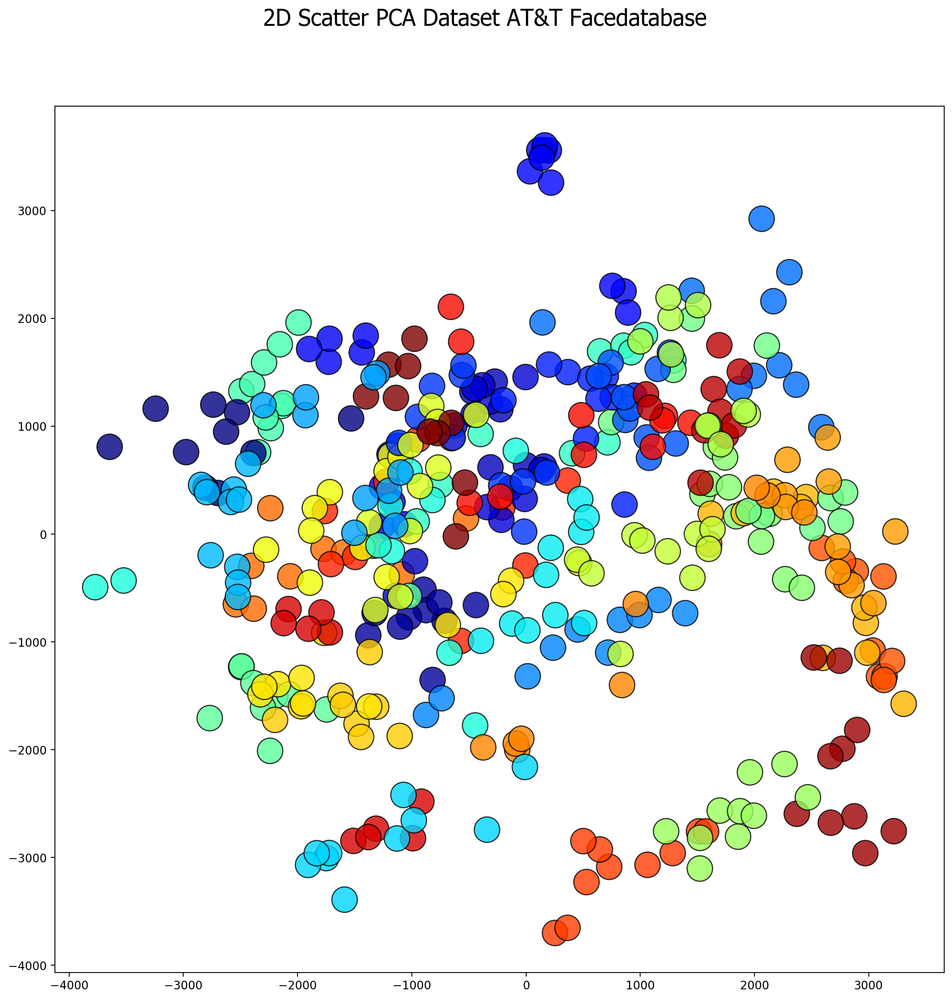

In [28]:
eigenval_att, eigenvectors_att, X_mean_att = pca(X_att)
eigenvectors_att = selectPcaComponents(X_att, eigenvectors_att, num_components = 2)
X_pca_att = pcaProject(X_att,eigenvectors_att, X_mean_att)

X_values = np.asarray(X_pca_att[0,:])[0]
Y_values = np.asarray(X_pca_att[1,:])[0]
title_main = '2D Scatter PCA Dataset AT&T Facedatabase'
fig, ax = plt.subplots(figsize = [14,14], dpi= 200) 
fig.text(.5, .95, title_main, create_font('Tahoma',20), horizontalalignment='center') 
ax.scatter(X_values ,Y_values, c=y_att, s=500, cmap= cm.jet, linewidths = 1, alpha = 0.8, edgecolors='k')
fig.savefig('ScatterPCAAT\&TFacedatabase.png')
plt.show()

## Scatter LDA Dataset AT\&T Facedatabase
>Vediamo come si comporta LDA mediante lo scatter del dataset AT\&T Facedatabase nel caso in cui usassimo 2 PCs quindi in un sottospazio 2d dello spazio originale

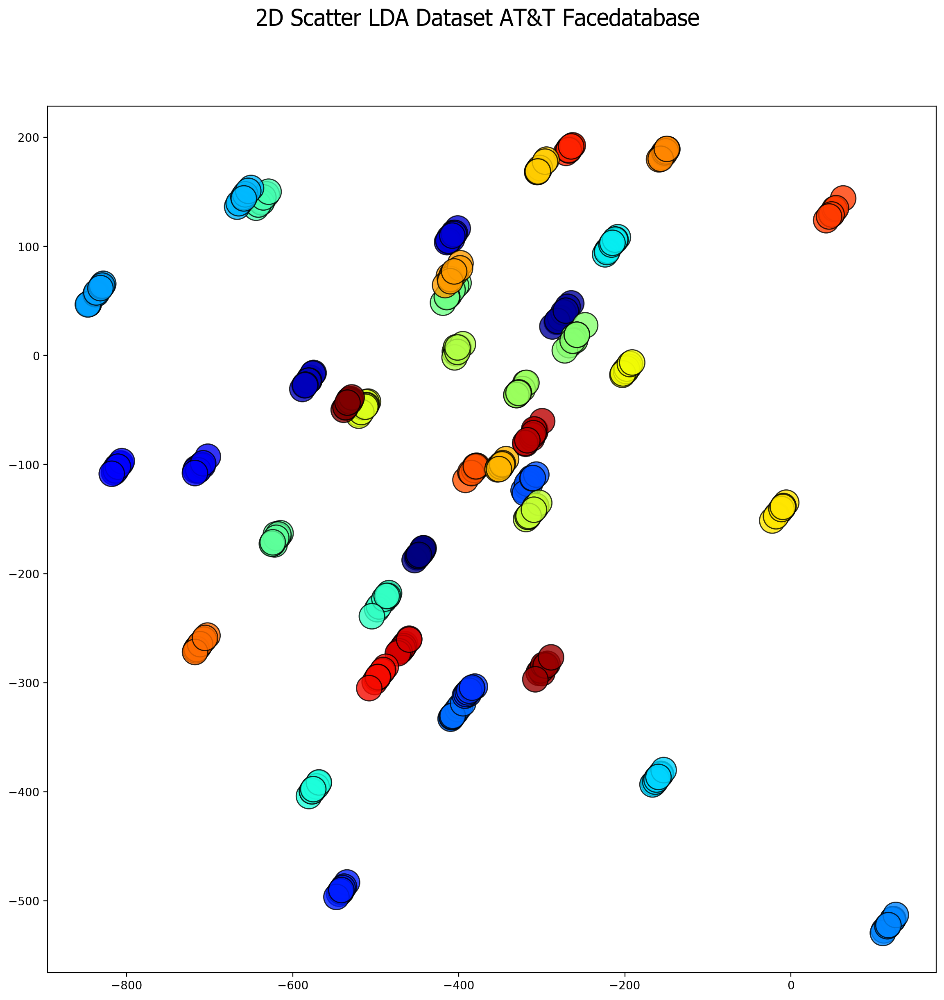

In [29]:
eigenvalues_lda_att, eigenvectors_lda_att = fisherfaces(X_att, y_att)
eigenvectors_lda_att = SelectLdaComponents(X_att, eigenvectors_lda_att, num_components= 2)
X_lda_att = ldaProject(X_att, eigenvectors_lda_att)

#Add noise to points for better visualization (too much point are overlapping)
noise = np.random.normal(0, 5,np.asarray(X_lda_att[0,:])[0].size)
X_values = noise + np.asarray(X_lda_att[0,:])[0]
Y_values = noise + np.asarray(X_lda_att[1,:])[0]
title_main = '2D Scatter LDA Dataset AT&T Facedatabase'
fig, ax = plt.subplots(figsize = [14,14], dpi= 200) 
fig.text(.5, .95, title_main, create_font('Tahoma',20), horizontalalignment='center') 
ax.scatter(X_values, Y_values, c=y_att, s=500, cmap= cm.jet, linewidths = 1, alpha = 0.8, edgecolors='k')
fig.savefig('ScatterLDAAT\&TFacedatabase.png')
plt.show()

# Dataset Yalefaces A
>Importo le immagini dei volti del dataset Dataset Yalefaces A e creo la matrice delle componenti

In [18]:
X,y =[],[] 
#path = os.walk('/Users/marco/Desktop/MASL/Datasets/yalefaces')
#for (root, dirs, file) in path:
    #print(root)
    #print(dirs)
    #print(file)
    #print ('--------------------------------')
for filename in os.listdir('/Users/marco/Desktop/MASL/Datasets/yalefaces'):    
    if '.txt' in filename or '.DS_Store' in filename :
        continue
    else:
        id_person = int(filename[7:9])
        #print(id_person)
        y.append(id_person)
        img = Image.open(os.path.join('/Users/marco/Desktop/MASL/Datasets/yalefaces', filename))
        img = img.convert("L")
        X.append(np.asarray(img,dtype=np.uint8))
        
y_yale = np.asarray(y)
X_yale = imgToComponent(X)
shape_yale = X[0].shape

## Scatter PCA Dataset Yalefaces A
>Vediamo come si comporta PCA mediante lo scatter del dataset Yalefaces A nel caso in cui usassimo 2 PCs quindi in un sottospazio 2d dello spazio originale

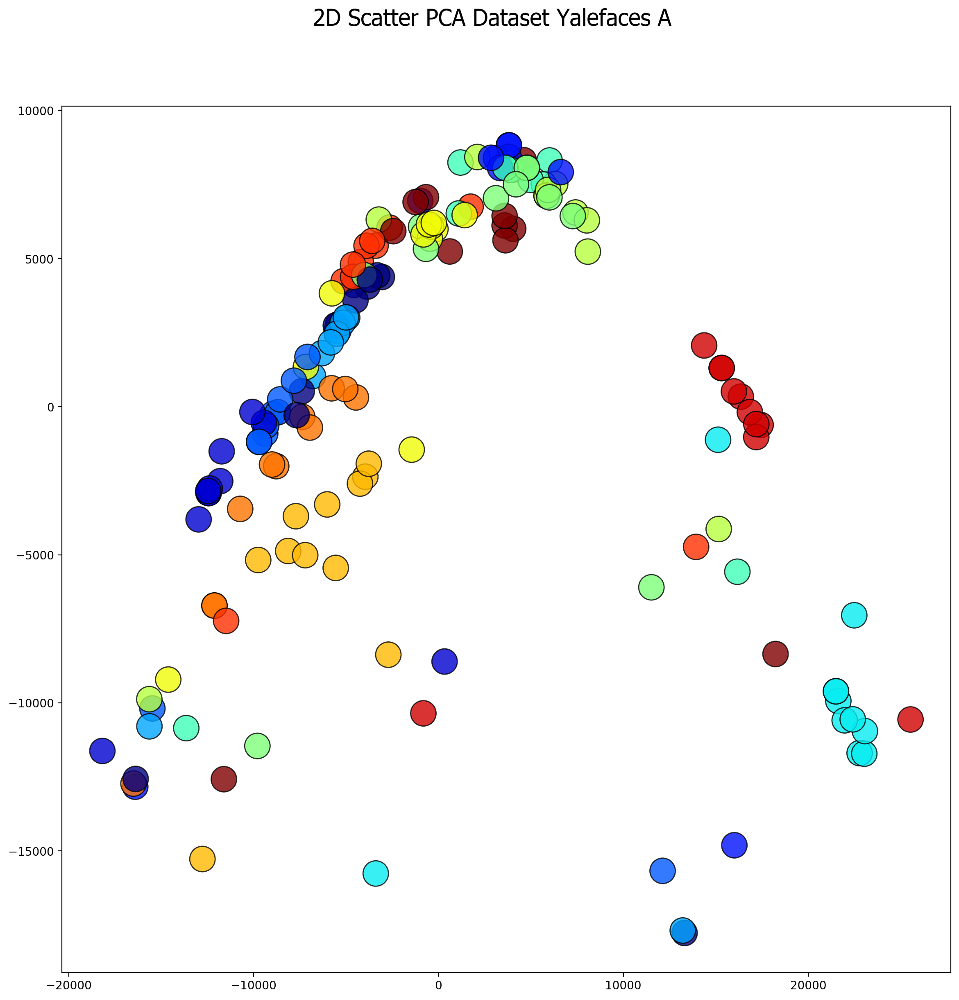

In [104]:
eigenval_yale, eigenvectors_yale, X_mean_yale = pca(X_yale)
eigenvectors_yale = selectPcaComponents(X_yale, eigenvectors_yale.real, num_components = 2)
X_pca_yale = pcaProject(X_yale,eigenvectors_yale, X_mean_yale)

X_values = np.asarray(X_pca_yale[0,:])[0]
Y_values = np.asarray(X_pca_yale[1,:])[0]
title_main = '2D Scatter PCA Dataset Yalefaces A'
fig, ax = plt.subplots(figsize = [14,14], dpi= 200) 
fig.text(.5, .95, title_main, create_font('Tahoma',20), horizontalalignment='center') 
ax.scatter(X_values ,Y_values, c=y_yale, s=500, cmap= cm.jet, linewidths = 1, alpha = 0.8, edgecolors='k')
fig.savefig('ScatterPCAYalefacesA.png')
plt.show()

## Scatter LDA Dataset Yalefaces A
>Vediamo come si comporta LDA mediante lo scatter del dataset Yalefaces A nel caso in cui usassimo 2 PCs quindi in un sottospazio 2d dello spazio originale

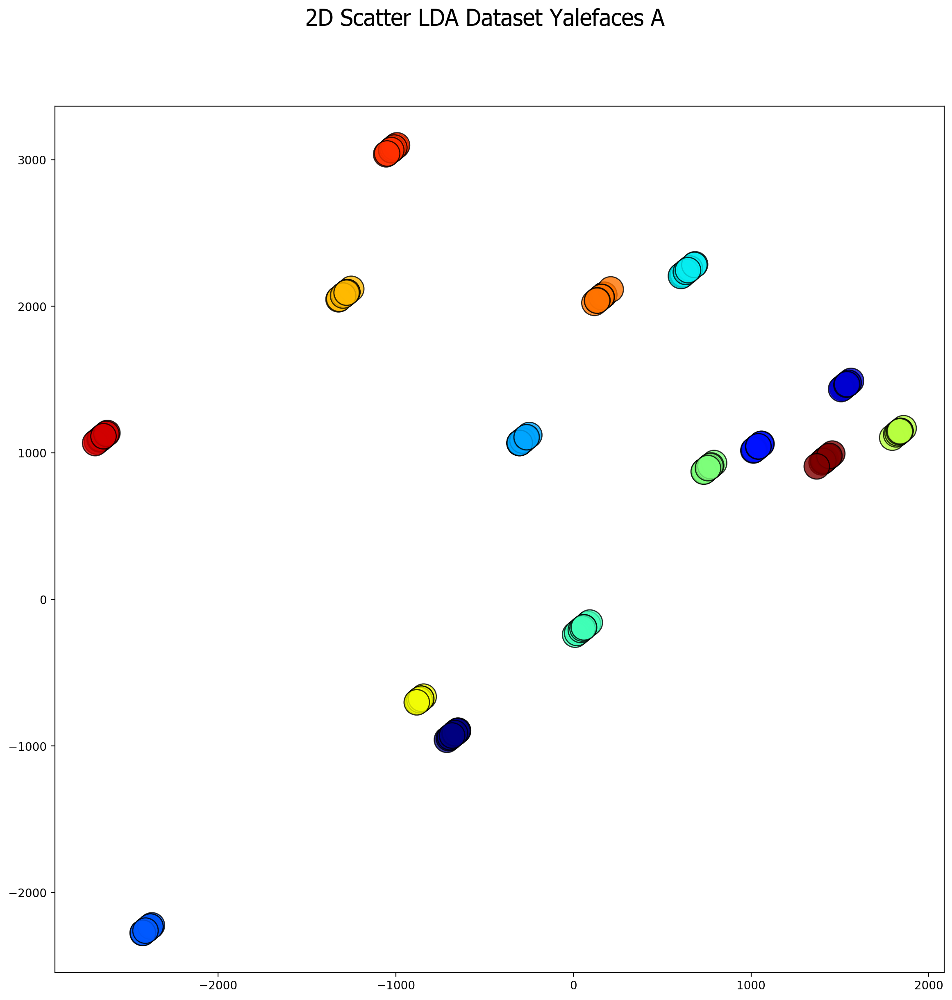

In [105]:
eigenvalues_lda_yale, eigenvectors_lda_yale = fisherfaces(X_yale, y_yale)
eigenvectors_lda_yale = SelectLdaComponents(X_yale, eigenvectors_lda_yale, num_components= 2)
X_lda_yale = ldaProject(X_yale, eigenvectors_lda_yale)
#Add noise to points for better visualization (too much point are overlapping)
noise = np.random.normal(0, 20,np.asarray(X_lda_yale[0,:])[0].size)
X_values = noise + np.asarray(X_lda_yale[0,:])[0]
Y_values = noise + np.asarray(X_lda_yale[1,:])[0]
title_main = '2D Scatter LDA Dataset Yalefaces A'
fig, ax = plt.subplots(figsize = [14,14], dpi= 200) 
fig.text(.5, .95, title_main, create_font('Tahoma',20), horizontalalignment='center') 
ax.scatter(X_values, Y_values, c=y_yale, s=500, cmap= cm.jet, linewidths = 1, alpha = 0.8, edgecolors='k')
fig.savefig('ScatterLDAYalefacesA.png')
plt.show()

## Scatter plots affiancati

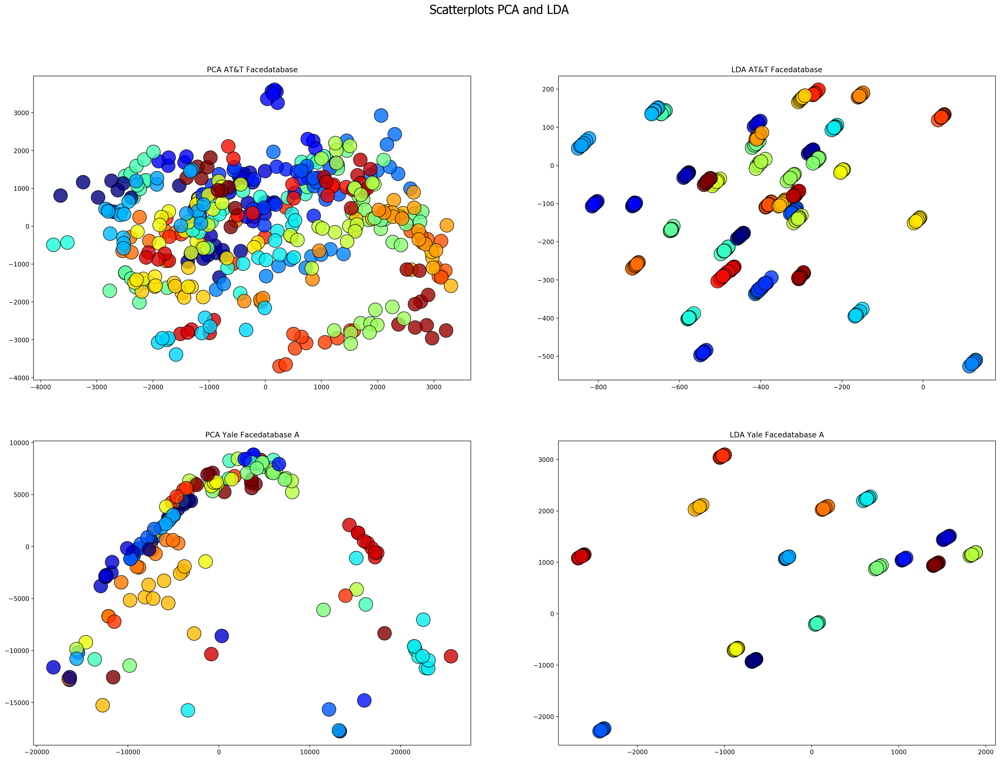

In [405]:
eigenval_att, eigenvectors_att, X_mean_att = pca(X_att)
eigenvectors_att = selectPcaComponents(X_att, eigenvectors_att, num_components = 2)
X_pca_att = pcaProject(X_att,eigenvectors_att, X_mean_att)
X_values_pca_att = np.asarray(X_pca_att[0,:])[0]
Y_values_pca_att = np.asarray(X_pca_att[1,:])[0]



eigenvalues_lda_att, eigenvectors_lda_att = fisherfaces(X_att, y_att)
eigenvectors_lda_att = SelectLdaComponents(X_att, eigenvectors_lda_att, num_components= 2)
X_lda_att = ldaProject(X_att, eigenvectors_lda_att)
#Add noise to points for better visualization (too much point are overlapping)
noise = np.random.normal(0, 5,np.asarray(X_lda_att[0,:])[0].size)
X_values_lda_att = noise + np.asarray(X_lda_att[0,:])[0]
Y_values_lda_att = noise + np.asarray(X_lda_att[1,:])[0]




eigenval_yale, eigenvectors_yale, X_mean_yale = pca(X_yale)
eigenvectors_yale = selectPcaComponents(X_yale, eigenvectors_yale.real, num_components = 2)
X_pca_yale = pcaProject(X_yale,eigenvectors_yale, X_mean_yale)
X_values_pca_yale = np.asarray(X_pca_yale[0,:])[0]
Y_values_pca_yale = np.asarray(X_pca_yale[1,:])[0]



eigenvalues_lda_yale, eigenvectors_lda_yale = fisherfaces(X_yale, y_yale)
eigenvectors_lda_yale = SelectLdaComponents(X_yale, eigenvectors_lda_yale, num_components= 2)
X_lda_yale = ldaProject(X_yale, eigenvectors_lda_yale)
#Add noise to points for better visualization (too much point are overlapping)
noise = np.random.normal(0, 20,np.asarray(X_lda_yale[0,:])[0].size)
X_values_lda_yale = noise + np.asarray(X_lda_yale[0,:])[0]
Y_values_lda_yale = noise + np.asarray(X_lda_yale[1,:])[0]



fig, (axs) = plt.subplots(2,2,figsize = [28,20], dpi= 200) 
fig.text(.5, .95, 'Scatterplots PCA and LDA', create_font('Tahoma',20), horizontalalignment='center') 

axs[0,0].scatter(X_values_pca_att, Y_values_pca_att, c=y_att, s=500, cmap= cm.jet, linewidths = 1, alpha = 0.8, edgecolors='k')

axs[0,0].set(title='PCA AT&T Facedatabase')
#axs[0,0].grid()


axs[0,1].scatter(X_values_lda_att, Y_values_lda_att, c=y_att, s=500, cmap= cm.jet, linewidths = 1, alpha = 0.8, edgecolors='k')

axs[0,1].set(title='LDA AT&T Facedatabase')
#axs[0,1].grid()

axs[1,0].scatter(X_values_pca_yale, Y_values_pca_yale, c=y_yale, s=500, cmap= cm.jet, linewidths = 1, alpha = 0.8, edgecolors='k')

axs[1,0].set(title='PCA Yale Facedatabase A')
#axs[1,0].grid()



axs[1,1].scatter(X_values_lda_yale, Y_values_lda_yale, c=y_yale, s=500, cmap= cm.jet, linewidths = 1, alpha = 0.8, edgecolors='k')
axs[1,1].set(title='LDA Yale Facedatabase A')





fig.savefig("ScatterplotsPCAandLDA.png")
plt.show()

# Classificazione
>Proviamo adesso a classificare le immagini dei vari datasets con l'algoritmo K-Nearest Neighbor per K=1


>Definiamo prima di tutto le due funzioni che ci serviranno per ottenere i risultati di classificazione all'aumentare del numero di PCs utilizzate e che stampino anche i plot dei risultati ottenuti sia con PCA che con LDA
### Function: cross_validation
>Proietto il training set e poi il test set viene proiettato nello stesso sottospazio del trining set, quindi usando gli stessi autovettori (e la stessa media per pca) calcolata per il set di training<br>
Successivamente, faccio il test sia per PCA che per LDA con il miglior parametro (numero di componenti) trovato durante la fase di validazione trovando l'accuratezza

In [21]:
def cross_validation(X, y, min_comp=10, max_comp=20, step_comp=1, folds=5):
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.model_selection import cross_val_score, KFold, train_test_split

    X_train_set, X_test, y_train_set, y_test = train_test_split(X.T, y, test_size=0.25, random_state=0)
    #print(X_train_set.shape)
    c = np.unique(y_train_set)
    max_comp_lda = min(len(c), max_comp)
    neigh = KNeighborsClassifier(n_neighbors=1, weights='uniform')  
    num_components_pca = list(range(min_comp, max_comp, step_comp))
    accuracy_pca = [0] * len(num_components_pca)
    accuracy_lda = [0] * (max_comp_lda-1)
    num_components_lda = list(range(min_comp, max_comp_lda, step_comp))

    #5-Fold CV
    kf = KFold(n_splits=folds)
    for train, validation in kf.split(X_train_set):
        X_train, X_validation, y_train, y_validation = X_train_set[train,:], X_train_set[validation,:], y_train_set[train], y_train_set[validation]
        
        eigenval_train, eigenvectors_train, X_mean_train = pca(X_train.T)
        eigenval_lda_train, eigenvectors_lda_train = fisherfaces(X_train.T, y_train)     
        #Search value of num_components that do best accuracy 
        component = 0
        for comp in range(min_comp,max_comp,step_comp):      
            eigenvectors_train_comp = selectPcaComponents(X_train.T, eigenvectors_train.real, num_components = comp)
            #Project train sets
            X_pca_train = pcaProject(X_train.T,eigenvectors_train_comp, X_mean_train)
            #Project validation sets
            X_pca_validation = pcaProject(X_validation.T,eigenvectors_train_comp, X_mean_train)

            clf = neigh.fit(X_pca_train.T, y_train)
            score = clf.score(X_pca_validation.T, y_validation)
            #print(score)
            accuracy_pca[component] += score
            
            if comp < max_comp_lda: 
                eigenvectors_lda_train_comp = SelectLdaComponents(X_train.T, eigenvectors_lda_train.real, num_components = comp)
                #Project train sets
                X_lda_train = ldaProject(X_train.T, eigenvectors_lda_train_comp)
                #Project validation sets
                X_lda_validation = ldaProject(X_validation.T, eigenvectors_lda_train_comp)
                clf = neigh.fit(X_lda_train.T, y_train)
                score = clf.score(X_lda_validation.T, y_validation)
                accuracy_lda[component] += score
            component += 1

    #print(accuracy_pca)
    accuracy_pca[:] = [x / folds for x in accuracy_pca]
    accuracy_lda[:] = [x / folds for x in accuracy_lda]
    #Find best parameter (num_components)
    bestAccuracyPca = accuracy_pca.index(max(accuracy_pca))
    bestNumCompPca = num_components_pca[bestAccuracyPca]
    bestAccuracyLda = accuracy_lda.index(max(accuracy_lda))
    bestNumCompLda = num_components_lda[bestAccuracyLda]
    
    #Compute PCA and LDA on all taining set
    eigenval_train, eigenvectors_train, X_mean_train = pca(X_train_set.T)  
    eigenvectors_train = selectPcaComponents(X_train_set.T, eigenvectors_train.real, num_components = bestNumCompPca)
    #Project train set
    X_pca_train = pcaProject(X_train_set.T,eigenvectors_train, X_mean_train)
    #Project test set
    X_pca_test = pcaProject(X_test.T,eigenvectors_train, X_mean_train)   
    clf = neigh.fit(X_pca_train.T, y_train_set)
    scorePCA = clf.score(X_pca_test.T, y_test)
    
     
    
    eigenval_lda_train, eigenvectors_lda_train = fisherfaces(X_train_set.T, y_train_set)
    eigenvectors_lda_train = SelectLdaComponents(X_train_set.T, eigenvectors_lda_train.real, num_components = comp)
    #Project train set
    X_lda_train = ldaProject(X_train_set.T, eigenvectors_lda_train)
    #Project test set
    X_lda_test = ldaProject(X_test.T, eigenvectors_lda_train)            
    clf = neigh.fit(X_lda_train.T, y_train_set)
    scoreLDA = clf.score(X_lda_test.T, y_test)

    
    return(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, scorePCA, scoreLDA, bestNumCompPca, bestNumCompLda)

## Function: predict

In [22]:
def predict(X_train, X_test, y_train, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 3):
    
    c = np.unique(y_train)
    max_comp_lda = min(len(c), max_comp)
    neigh = KNeighborsClassifier(n_neighbors=1, weights='uniform')  
    num_components_pca = list(range(min_comp, max_comp, step_comp))
    accuracy_pca = [0] * len(num_components_pca)
    accuracy_pcawo_comp = [0] * len(num_components_pca)
    accuracy_lda = [0] * (max_comp_lda-1)
    num_components_lda = list(range(min_comp, max_comp_lda, step_comp))

    eigenval_train, eigenvectors_train, X_mean_train = pca(X_train)
    eigenval_lda_train, eigenvectors_lda_train = fisherfaces(X_train, y_train)
    #Search value of num_components that do best accuracy 
    component = 0
    for comp in range(min_comp,max_comp,step_comp):     
        eigenvectors_train_comp = selectPcaComponents(X_train, eigenvectors_train.real, num_components = comp)
        #Project train sets
        X_pca_train = pcaProject(X_train, eigenvectors_train_comp, X_mean_train)
        #Project validation sets
        X_pca_test = pcaProject(X_test, eigenvectors_train_comp, X_mean_train)
        clf = neigh.fit(X_pca_train.T, y_train)
        score = clf.score(X_pca_test.T, y_test)
        #print(score)
        accuracy_pca[component] += score
        
        
        #Compute PCA without first 3 components
        eigenvectors_train_comp = eigenvectors_train[:,pcawo:].real
        eigenvectors_train_comp = selectPcaComponents(X_train, eigenvectors_train_comp, num_components = comp)
        #Project train sets
        X_pca_train = pcaProject(X_train, eigenvectors_train_comp, X_mean_train)
        #Project validation sets
        X_pca_test = pcaProject(X_test, eigenvectors_train_comp, X_mean_train)
        clf = neigh.fit(X_pca_train.T, y_train)
        score = clf.score(X_pca_test.T, y_test)
        #print(score)
        accuracy_pcawo_comp[component] += score
        
        
             
        if comp < max_comp_lda: 
            eigenvectors_lda_train_comp = SelectLdaComponents(X_train, eigenvectors_lda_train.real, num_components = comp)
            #Project train sets
            X_lda_train = ldaProject(X_train, eigenvectors_lda_train_comp)
            #Project validation sets
            X_lda_test = ldaProject(X_test, eigenvectors_lda_train_comp)
            clf = neigh.fit(X_lda_train.T, y_train)
            score = clf.score(X_lda_test.T, y_test)
            accuracy_lda[component] += score
            
        component += 1
    return (accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda)

>Definiamo anche la funzione plotCV che ci aiuterà a generare i plot dei test effettuati
### Function: plotCV

In [25]:
def plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp=[], dataset_name='', fig_name='CVplot', pcawo = 0):
    fig_name = fig_name + '.png'
    fig, ax = plt.subplots(figsize = [14,5], dpi= 200) 
    ax.plot(num_components_pca, accuracy_pca, marker='o',label='PCA')
    ax.set(xlabel='# Components', ylabel='Accuracy')
    ax.grid()
    ax.set_xticks(num_components_pca)     
    ax.plot(num_components_lda, accuracy_lda, marker='s', linestyle='--', label='LDA')
    
    if (len(accuracy_pcawo_comp) > 0):
        ax.plot(num_components_pca, accuracy_pcawo_comp, marker='D', linestyle=':', label='PCA without first ' +str(pcawo)+ ' components')

    ax.legend()
    fig.savefig(fig_name)
    plt.show()

# Dataset AT\&T Facedatabase
## 5-Fold Cross Validation
>Plot accuracy with KNN (K=1) to the increase of PCs with Leave One Out CV in AT\&T Facedatabase<br>
Faccio una 5-Fold CV per trovare il miglior numero di componenti per entrambi i metodi e successivamente provo a clasificare l'insieme di test (che ha dimensione del 25%).<br>

In [52]:
num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, scorePCA, scoreLDA, compPCA, compLDA = cross_validation(X_att, y_att, min_comp=1, max_comp=21, step_comp=1, folds= 5)
#plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, dataset_name='AT&T Facedatabase', fig_name='5FcvPCAandLDAattFacedatabase',folds= 5)
print('Accuracy PCA on the test set:  %f' % scorePCA)
print('Num Components PCA used:  %d' % compPCA)
print('Accuracy LDA on the test set:  %f' % scoreLDA)
print('Num Components LDA used:  %d' % compLDA)

Accuracy PCA on the test set:  0.930000
Num Components PCA used:  11
Accuracy LDA on the test set:  0.950000
Num Components LDA used:  15


## Accuracy all'aumentare del numero di componenti
>Proviamo adesso, senza cercare il miglior parametro (num_components) come varia l'accuratezza dei due metodi a parità di numero di componenti, al loro crescere.

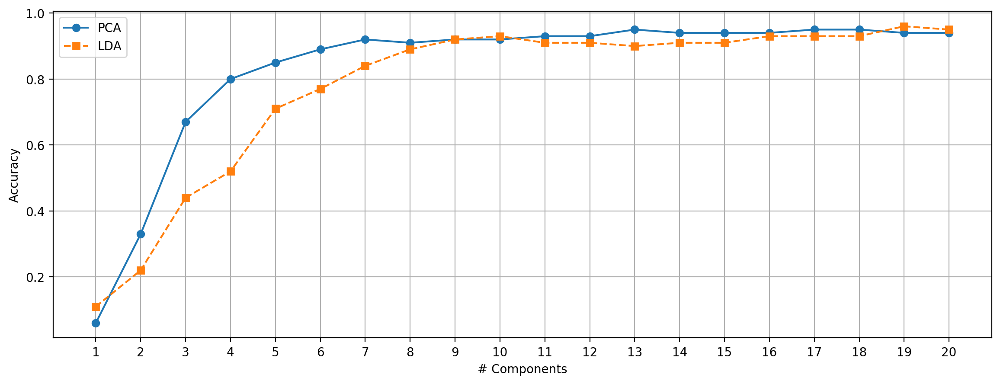

In [40]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_att.T, y_att, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, dataset_name='AT&T Facedatabase', fig_name='AttFacedatabaseTest')    

# Dataset Yalefaces A
## 5-Fold CV Yalefaces A
>Provo a classificare le immagini dei volti del dataset Yalefaces A come fatto già in precedenza con l'altro dataset confrontando le prestazioni dei metodi Eigenfaces e Fisherfaces<br> <br>
In questo caso, gli autovalori ed autovettori trovati in Python hanno anche una parte immaginaria, dovuta a piccoli errori di precisione numerici nel calcolo. Dato che la matrice di covarianza è simmetrica a valori reali e quindi gli autovalori e autovettori devono essere reali. La parte immaginaria dunque può essere ignorata.

In [391]:
num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, scorePCA, scoreLDA, compPCA, compLDA = cross_validation(X_yale, y_yale, min_comp=1, max_comp=21, step_comp=1, folds=5)
#plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, dataset_name='Yalefaces A', fig_name='5FcvPCAandLDAyalefacesA',folds= 5)
print('Accuracy PCA on the test set:  %f' % scorePCA)
print('Num Components PCA used:  %d' % compPCA)
print('Accuracy LDA on the test set:  %f' % scoreLDA)
print('Num Components LDA used:  %d' % compLDA)

Accuracy PCA on the test set:  0.761905
Num Components PCA used:  20
Accuracy LDA on the test set:  0.833333
Num Components LDA used:  8


## Accuracy all'aumentare del numero di componenti
>Proviamo adesso, senza cercare il miglior parametro (num_components) come varia l'accuratezza dei due metodi a parità di numero di componenti, al loro crescere.

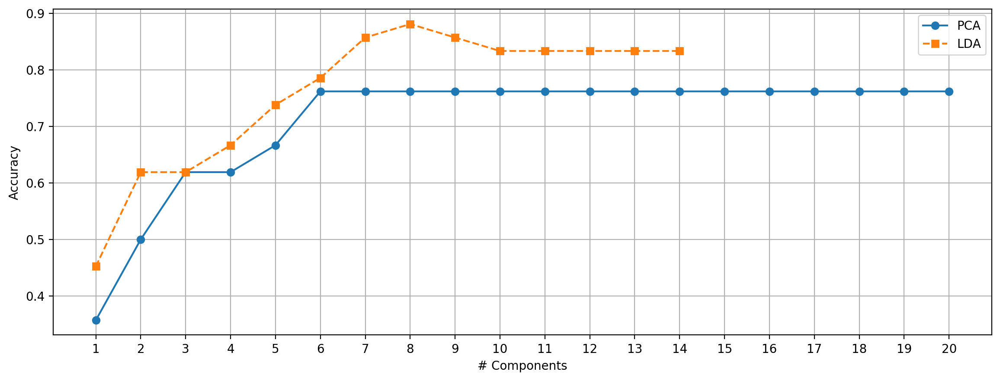

In [41]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yale.T, y_yale, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, dataset_name='Yalefaces A', fig_name='YalefaceATest')    

# Dataset Extended Yale Facedatabase B 
>Importo le immagini dei volti del dataset Extended Yale Facedatabase B e creo la matrice delle componenti per fare i tests.<br>
Questo dataset si focalizza sulla diversa illuminazione delle immagini. I volti sono ripresi più volte con ampie variazioni di illuminazione.

In [42]:
X,y =[],[] 
for subdir in os.listdir('/Users/marco/Desktop/MASL/Datasets/CroppedYale'):  
    if '.txt' in subdir or '.DS_Store' in subdir :
        continue
    else:
        #id_person = int(subdir[-2:])
        #y.append(id_person)
        temp_dir = os.path.join('/Users/marco/Desktop/MASL/Datasets/CroppedYale',subdir)
        for filename in os.listdir(temp_dir):
            if '.pgm' not in filename or 'Ambient' in filename or '.bad' in filename:
                continue
            else:    
                img = Image.open(os.path.join(temp_dir, filename))
                img = img.convert("L")
                X.append(np.asarray(img,dtype=np.uint8))
                id_person = int(subdir[-2:])
                y.append(id_person)
                
y_yaleB = np.asarray(y)
X_yaleB = imgToComponent(X)
shape_yaleB = X[0].shape

## 5-Fold CV Extended Yale Facedatabase B
>Provo a classificare le immagini dei volti del dataset Extended Yale Facedatabase B come fatto già in precedenza con gli altri confrontando le prestazioni dei metodi Eigenfaces e Fisherfaces.<br> <br>
In questo caso, gli autovalori ed autovettori trovati in Python hanno anche una parte immaginaria, dovuta a piccoli errori di precisione numerici nel calcolo. Dato che la matrice di covarianza è simmetrica a valori reali e quindi gli autovalori e autovettori devono essere reali. La parte immaginaria dunque può essere ignorata.

In [448]:
num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, scorePCA, scoreLDA, compPCA, compLDA = cross_validation(X_yaleB, y_yaleB, min_comp=1, max_comp=21, step_comp=1, folds=5)
#plotCV(num_components_pca, num_components_lda, accuracy_pcawo_comp, accuracy_pca, accuracy_lda, dataset_name='Yalefaces B', fig_name='5FcvPCAandLDAyalefacesB',folds= 5)
print('Accuracy PCA on the test set:  %f' % scorePCA)
print('Num Components PCA used:  %d' % compPCA)
print('Accuracy LDA on the test set:  %f' % scoreLDA)
print('Num Components LDA used:  %d' % compLDA)

Accuracy PCA on the test set:  0.369205
Num Components PCA used:  20
Accuracy LDA on the test set:  0.740066
Num Components LDA used:  20


## Accuracy all'aumentare del numero di componenti
>Proviamo adesso, senza cercare il miglior parametro (num_components) come varia l'accuratezza dei due metodi a parità di numero di componenti, al loro crescere.

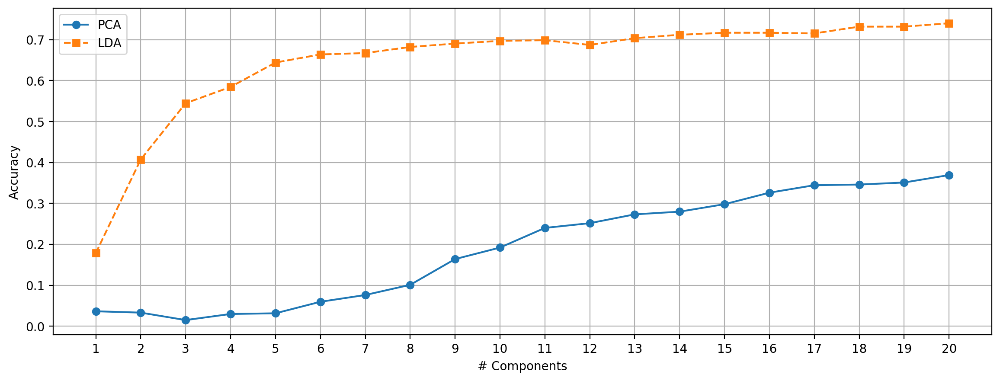

In [418]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, dataset_name='Yalefaces B', fig_name='YalefaceBTest')    

# Test sul Dataset YALEFACES A

# Dataset Yalefaces A

>I test precedenti mostrano come LDA restituisca generalmente migliori risultati di classificazione rispetto a PCA. I test sono però stati fatti con un training set molto grande, che comprendeva il 75% dei volti del Dataset. Vediamo cosa succede nel caso in cui il training set è più piccolo. In praticolare, provo a creare un'insieme di training con pochi campioni per classe, vedendo se cambiano i risultati e quindi se magari PCA supera LDA. <br>
Provo su questo dataset in quanto è l'unico in cui tutte le immagini dei volti hanno più o meno la stessa buona illuminazione. <br>
Campionando pochi volti casualmente da tutto il dataset PCA migliora molto le prestazioni comparato con LDA, superandolo spesso in accuratezza. Questo fa evincere il fatto che se i volti non sono campionati uniformemente oppure nel caso in cui ci siano pochi campioni per classe (o anche nessuno per alcune classi) PCA potrebbe essere migliore di LDA. <br>
Questo test è stato utilizzato per simulare il caso in cui si ha a disposizione un'isieme di training limitato oppure non campionato uniformemente rispetto alla popolazione con magari tante immagini di un volto ma poche o nessuna di altri, oppure ancora, semplicemente quando il numero di campioni per classe è limitato.
   

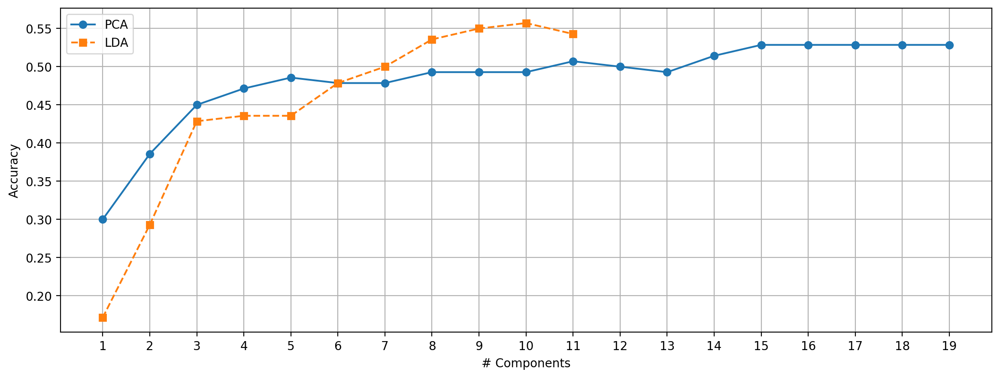

In [39]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, KFold, train_test_split
import random

#QUA AVEVO FATTO UNA PROVA TENENDO SEMPRE LE PRIME DUE IMMAGINI DI OGNI VOLTO COME TRAINING SET
#MA IN QUEL CASO, ESSENDO COMUNQUE LE IMMAGINI MOLTO SIMILI FUNZIONA SEMPRE MEGLIO LDA
#Number of samples per class for train and test 
#num_train = 2
#num_test = 11 - num_train
#unique_elem = (np.unique(y_yale)).size
#train = []
#test = []
#Train and test set split
#for i in np.unique(y_yale):
    #indices = (np.array(np.where(y_yale == i))).flatten()
    #count = 0
    #for elem in indices:
        #if count < num_train:  
       #     train.append(elem)
       # else:
        #    test.append(elem)
        #count+=1
        
num_elem = y_yale.shape[0]
#elem_train = np.random.choice(num_elem-1, 17, replace=False)
elem_train = random.sample(range(num_elem), 25)
elem_test = []

for i in range(0, num_elem):
    if i not in elem_train:
        elem_test.append(i)
    
#Adesso in train e in test ho due liste python con gli indici degli elementi da inserire nel trainig set e test set
#X_train, X_test, y_train, y_test = X_yale[:,train], X_yale[:,test], y_yale[train], y_yale[test]

X_train, X_test, y_train, y_test = X_yale[:,elem_train], X_yale[:,elem_test], y_yale[elem_train], y_yale[elem_test]
accuracy_pca, accuracy_lda, accuracy_pcawo_comp,  num_components_pca,  num_components_lda = predict(X_train, X_test, y_train, y_test, min_comp=1, max_comp=20, step_comp=1)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, dataset_name='Yalefaces A', fig_name='PCAandLDAyalefacesASubset#1')




    

# Test illuminazione sul Dataset YALEFACES B

# Dataset Yalefaces B

>Nel caso del dataset YalefaceB provo ad eliminare alcune delle prime componenti di PCA, che probabilemente codificano l'illuminazione e vedere se effettivamente i risultati di PCA migliorano. Questo per vedere, quanto PCA è effettivamente influenzato da fattori esterni come l'illuminazione<br>
Come si può vedere, i risultati migliorano e non di poco!<br>


### Confronto con PCA senza la prima componente più grande

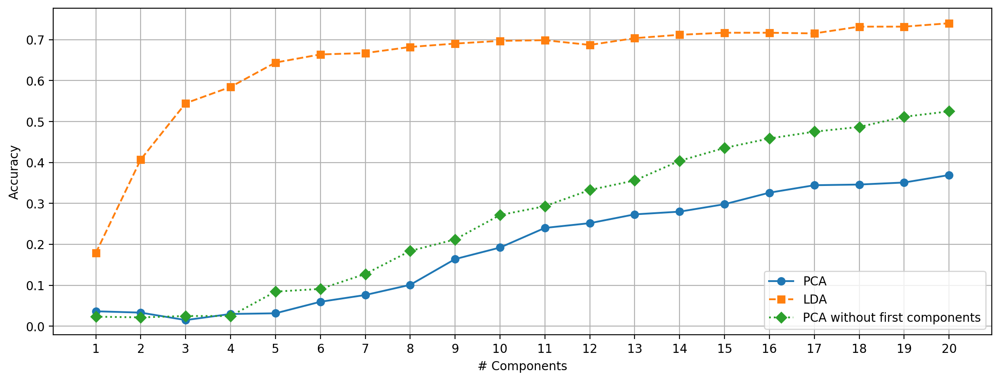

In [439]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 1)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum1Comp', pcawo = 1)  

### Confronto con PCA senza le prime 2 componenti più grandi

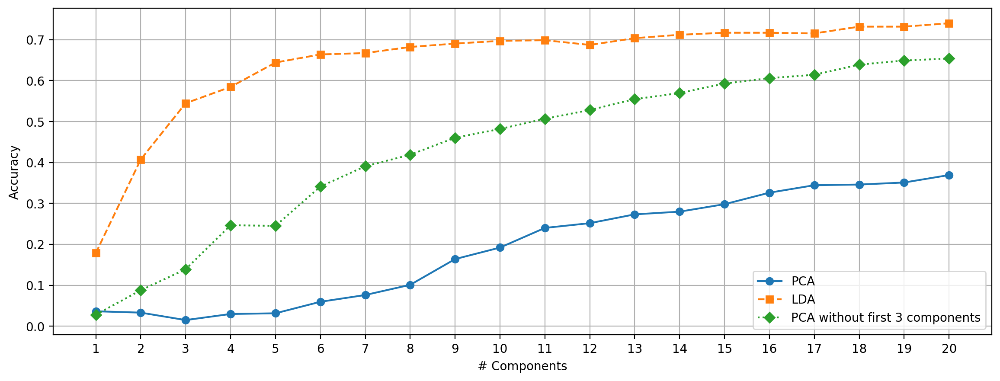

In [432]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 2)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum2Comp', pcawo = 2)  

### Confronto con PCA senza le prime 3 componenti più grandi

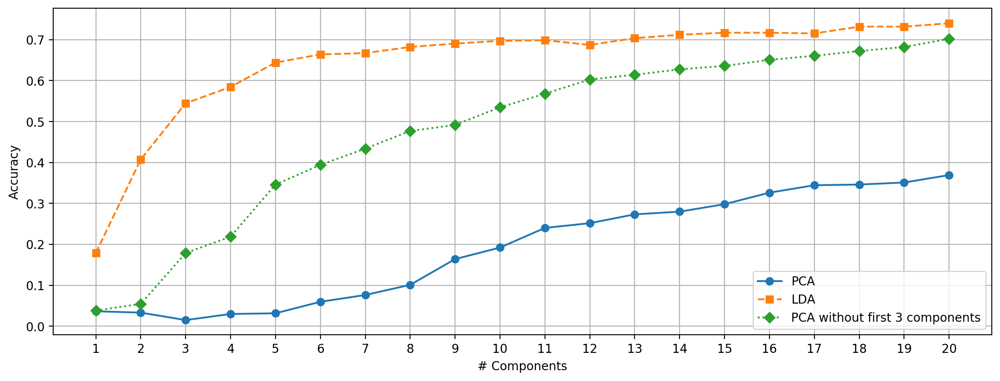

In [457]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 3)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum3Comp', pcawo = 3)    

### Confronto con PCA senza le prime 4 componenti più grandi

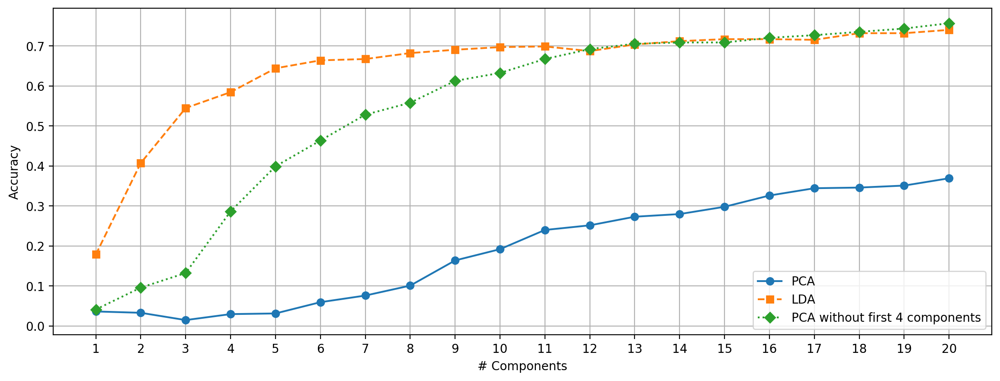

In [460]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 4)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum4Comp', pcawo = 4) 

### Confronto con PCA senza le prime 5 componenti più grandi

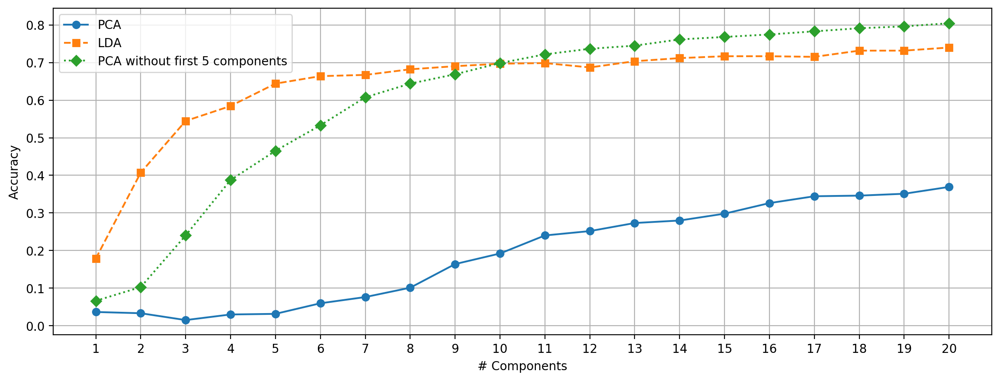

In [461]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 5)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum5Comp', pcawo = 5) 

### Confronto con PCA senza le prime 6 componenti più grandi

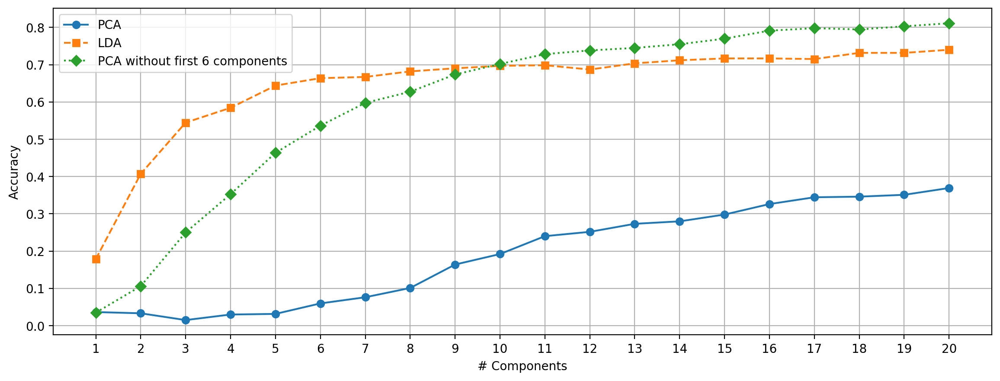

In [463]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 6)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum6Comp', pcawo = 6) 

### Confronto con PCA senza le prime 7 componenti più grandi

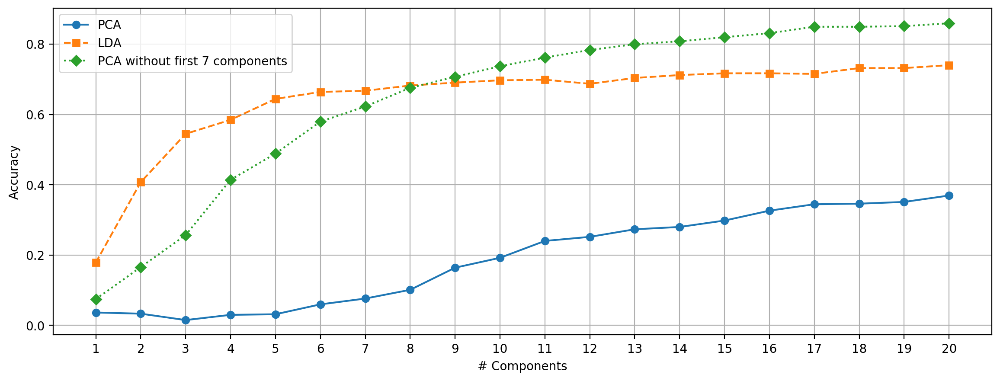

In [462]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 7)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum7Comp', pcawo = 7) 

### Confronto con PCA senza le prime 8 componenti più grandi

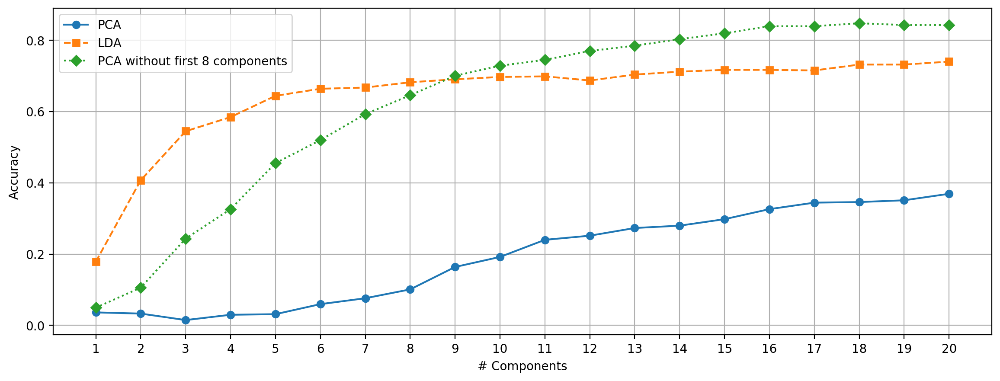

In [464]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 8)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum8Comp', pcawo = 8) 

### Confronto con PCA senza le prime 58 componenti più grandi

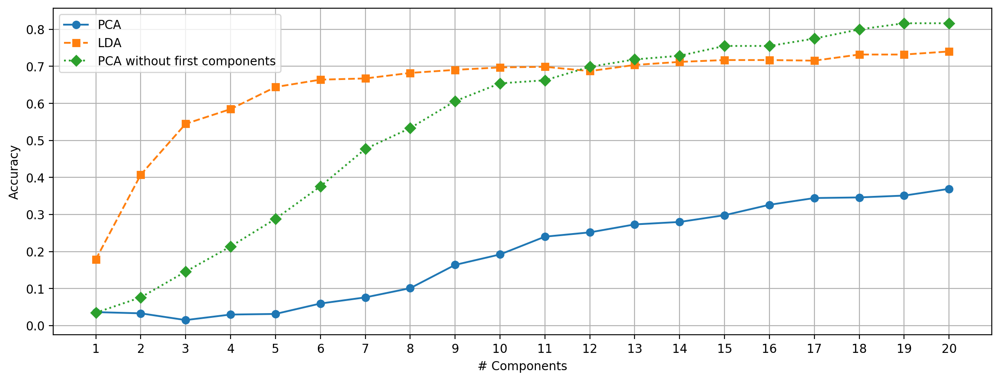

In [447]:
from sklearn.model_selection import train_test_split

X_train_set, X_test, y_train_set, y_test = train_test_split(X_yaleB.T, y_yaleB, test_size=0.25, random_state=0)

accuracy_pca, accuracy_lda, accuracy_pcawo_comp, num_components_pca, num_components_lda = predict(X_train_set.T, X_test.T, y_train_set, y_test, min_comp=1, max_comp=21, step_comp=1, pcawo = 58)
plotCV(num_components_pca, num_components_lda, accuracy_pca, accuracy_lda, accuracy_pcawo_comp, dataset_name='Yalefaces B', fig_name='YalefaceBIllum58Comp', pcawo = 58) 

In [19]:
X_yale.shape

(77760, 165)